# Import Statements

In [1]:
#import MySQLdb
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sn
import scipy.stats as stats
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import  GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_validate
from sklearn import metrics
from tabulate import tabulate
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from chart_studio import plotly as py
import plotly.graph_objs as go 
import warnings
warnings.filterwarnings('ignore')

# Connect to SQL Database

SQL method (uncomment to use this method)

In [2]:
# myvars = {}
# with open("patpage-mysql-password2") as myfile:
#     for line in myfile:
#         name, var = line.partition(":")[::2]
#         myvars[name.strip()] = var.strip()

# conn = MySQLdb.connect(host="localhost", user=myvars['DB username'], passwd=myvars['DB password'], db=myvars['DB databasename'])
# cursor = conn.cursor()  

# food_df = pd.read_sql('SELECT * FROM `Food_desert_data`', con=conn)

Offline method (best for when running Jupyter locally)

In [3]:
food_df = pd.read_csv("food_df.csv",index_col = 0)

# Data Cleaning

Visualizing the number of missing values in each column

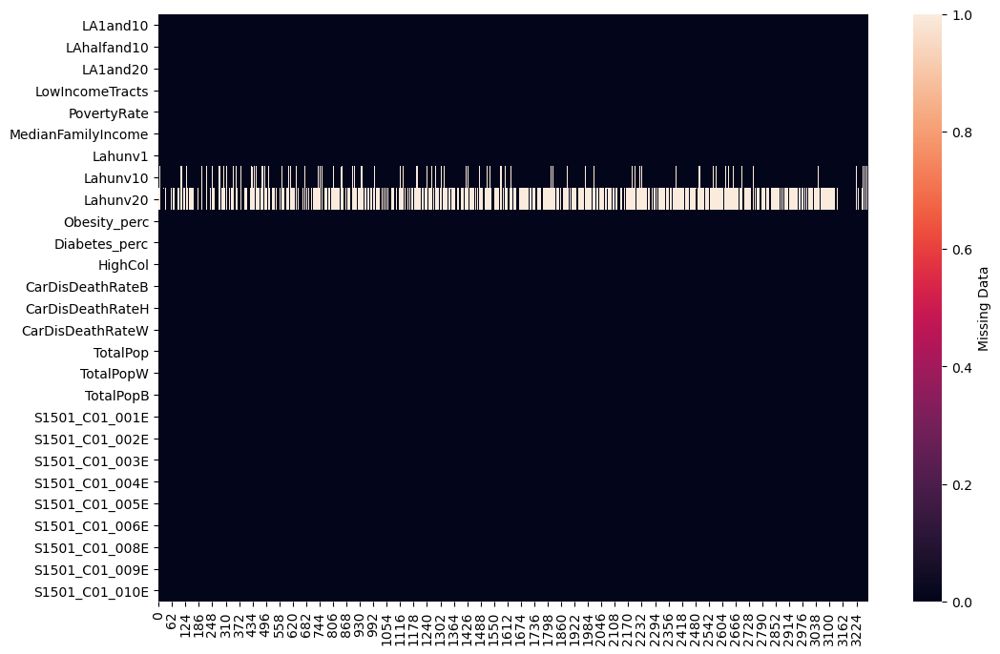

In [4]:
plt.figure(figsize=(12,8))
y=['ID','County','StateID']
x=food_df.drop(y,axis=1)
sn.heatmap(x.isna().transpose(), cbar_kws={'label': 'Missing Data'})
plt.legend
plt.show()

Quantifying missing values in each column

In [5]:
# Number of missing values in each column
miss_count_cols = food_df.isna().sum(axis=0)
miss_count_cols

ID                       0
County                   0
StateID                  0
LA1and10                 0
LAhalfand10              0
LA1and20                 0
LowIncomeTracts          0
PovertyRate              1
MedianFamilyIncome       2
Lahunv1                  2
Lahunv10               395
Lahunv20              2274
Obesity_perc             0
Diabetes_perc            0
HighCol                  0
CarDisDeathRateB         0
CarDisDeathRateH         0
CarDisDeathRateW         0
TotalPop                 0
TotalPopW                0
TotalPopB                0
S1501_C01_001E           0
S1501_C01_002E           0
S1501_C01_003E           0
S1501_C01_004E           0
S1501_C01_005E           0
S1501_C01_006E           0
S1501_C01_008E           0
S1501_C01_009E           0
S1501_C01_010E           0
dtype: int64

Identifying columns with missing values

In [6]:
# Columns with NULL values
print(miss_count_cols[miss_count_cols != 0])
miss_count_cols_names = miss_count_cols[miss_count_cols != 0].index.values

PovertyRate              1
MedianFamilyIncome       2
Lahunv1                  2
Lahunv10               395
Lahunv20              2274
dtype: int64


The columns with missing values are

In [7]:
print(miss_count_cols_names)

['PovertyRate' 'MedianFamilyIncome' 'Lahunv1' 'Lahunv10' 'Lahunv20']


Proportion of missing values in columns with missing values

In [8]:
food_df[miss_count_cols_names].isna().sum()/food_df.shape[0]

PovertyRate           0.000305
MedianFamilyIncome    0.000610
Lahunv1               0.000610
Lahunv10              0.120427
Lahunv20              0.693293
dtype: float64

Since more than 50% of the Lahunv20 column is null values, we will drop it

In [9]:
food_df.drop('Lahunv20',axis=1,inplace=True)

We will clean the four columns - PovertyRate, MedianFamilyIncome, Lahunv1 and Lahunv10

## 1. Cleaning PovertyRate

There is one missing value in PovertyRate column

In [10]:
food_df['PovertyRate'].isna().value_counts()

False    3279
True        1
Name: PovertyRate, dtype: int64

Record with the missing value for PovertyRate

In [11]:
food_df[food_df['PovertyRate'].isna()][['StateID','County','PovertyRate']]

,StateID,County,PovertyRate
2758,SD,Oglala Lakota,NaN


We replace the missing value with the mean of the PovertyRate in the state that the county belongs to

In [12]:
mean_PR_SD = food_df[food_df['StateID']=='SD']['PovertyRate'].mean()
food_df.loc[2758,'PovertyRate']=mean_PR_SD

Record after replacing the missing value for PovertyRate

In [13]:
food_df[food_df['ID']==13347][['StateID','County','PovertyRate']]

,StateID,County,PovertyRate
2758,SD,Oglala Lakota,15.171983


## 2. Cleaning MedianFamilyIncome

There are two missing value in MedianFamilyIncome column

In [14]:
food_df['MedianFamilyIncome'].isna().value_counts()

False    3278
True        2
Name: MedianFamilyIncome, dtype: int64

Records with the missing values for MedianFamilyIncome

In [15]:
food_df[food_df['MedianFamilyIncome'].isna()][['StateID','County','MedianFamilyIncome']]

,StateID,County,MedianFamilyIncome
666,NM,Rio Arriba,NaN
2758,SD,Oglala Lakota,NaN


We replace the missing value with the mean of the MedianFamilyIncome in the state that the county belongs to

In [16]:
mean_MFI_NM = food_df[food_df['StateID']=='NM']['MedianFamilyIncome'].mean()
mean_MFI_SD = food_df[food_df['StateID']=='SD']['MedianFamilyIncome'].mean()

In [17]:
food_df.loc[666,'MedianFamilyIncome']=mean_MFI_NM
food_df.loc[2758,'MedianFamilyIncome']=mean_MFI_SD

Records after replacing the missing value for MedianFamilyIncome

In [18]:
food_df.loc[[666,2758]][['StateID','County','MedianFamilyIncome']]

,StateID,County,MedianFamilyIncome
666,NM,Rio Arriba,52183.165152
2758,SD,Oglala Lakota,65290.290000


## 3. Cleaning Lahunv1

There are two missing values in Lahunv1 column

In [19]:
food_df['Lahunv1'].isna().value_counts()

False    3278
True        2
Name: Lahunv1, dtype: int64

Records with the missing values for Lahunv1

In [20]:
food_df[food_df['Lahunv1'].isna()][['StateID','County','Lahunv1']]

,StateID,County,Lahunv1
3230,VA,Alexander,NaN
3242,VA,Fallon,NaN


We replace the missing values with the mean of the Lahunv1 in the state that the county belongs to

In [21]:
MEAN_LA1_VA = food_df[food_df['StateID']=='VA']['Lahunv1'].mean()
food_df.loc[[3230,3242],'Lahunv1']=MEAN_LA1_VA

Records after replacing the missing values for Lahunv1

In [22]:
food_df.loc[[3230,3242]][['StateID','County','Lahunv1']]

,StateID,County,Lahunv1
3230,VA,Alexander,45.274313
3242,VA,Fallon,45.274313


## 4. Cleaning Lahunv10

There are 395 missing values in Lahunv10 column

In [23]:
food_df['Lahunv10'].isna().value_counts()

False    2885
True      395
Name: Lahunv10, dtype: int64

Records with the missing values for Lahunv10

In [24]:
ind_Lahunv10_missing_rows = food_df[food_df['Lahunv10'].isna()].index
food_df[food_df['Lahunv10'].isna()][['StateID','County','Lahunv10']]

,StateID,County,Lahunv10
1,HI,Kalawao,NaN
8,NY,New York,NaN
18,CA,San Francisco,NaN
28,VA,Arlington,NaN
33,CO,Broomfield,NaN
...,...,...,...
3266,VA,Porter,NaN
3268,VA,Racine,NaN
3272,VA,Starr,NaN
3275,VA,Wayne,NaN


Since there are a lot of missing values in this column, we will use the apply function to replace the missing values with the mean Lahunv10 value of the state that each county belongs to

In [25]:
food_df['Lahunv10']=food_df.apply(lambda row: food_df[food_df['StateID']==row['StateID']]['Lahunv10'].mean() if pd.isnull(row['Lahunv10']) else row['Lahunv10'],axis = 1)

Checking to see if all the missing values are resolved

In [26]:
food_df['Lahunv10'].isna().value_counts()

False    3277
True        3
Name: Lahunv10, dtype: int64

We can see from above that there are still 3 missing Lahunv10 values. Let us look into the States these counties belong to

In [27]:
food_df[food_df['Lahunv10'].isna()][['StateID','County','Lahunv10']]

,StateID,County,Lahunv10
838,DE,New Castle,NaN
1537,DE,Sussex,NaN
2513,DE,Kent,NaN


All these counties belong to state DE. Let us look at all the counties belonging to this state.

In [28]:
food_df[food_df['StateID']=='DE']['Lahunv10']

838    NaN
1537   NaN
2513   NaN
Name: Lahunv10, dtype: float64

The reason for the NaN values after implementing the apply function is because all the counties in state DE have NaN values for their Lahunv10 values. So we will use the mean Lahunv10 value of the entire dataset for the counties in state DE

In [29]:
food_df.loc[food_df['StateID']=='DE','Lahunv10']=food_df['Lahunv10'].mean()

Record after replacing the missing value for Lahunv10

In [30]:
food_df.iloc[ind_Lahunv10_missing_rows][['StateID','County','Lahunv10']]

,StateID,County,Lahunv10
1,HI,Kalawao,6.983333
8,NY,New York,7.310822
18,CA,San Francisco,9.467295
28,VA,Arlington,7.577326
33,CO,Broomfield,7.388924
...,...,...,...
3266,VA,Porter,7.577326
3268,VA,Racine,7.577326
3272,VA,Starr,7.577326
3275,VA,Wayne,7.577326


## Rechecking for NULL values

In [31]:
food_df.isna().sum(axis=0)

ID                    0
County                0
StateID               0
LA1and10              0
LAhalfand10           0
LA1and20              0
LowIncomeTracts       0
PovertyRate           0
MedianFamilyIncome    0
Lahunv1               0
Lahunv10              0
Obesity_perc          0
Diabetes_perc         0
HighCol               0
CarDisDeathRateB      0
CarDisDeathRateH      0
CarDisDeathRateW      0
TotalPop              0
TotalPopW             0
TotalPopB             0
S1501_C01_001E        0
S1501_C01_002E        0
S1501_C01_003E        0
S1501_C01_004E        0
S1501_C01_005E        0
S1501_C01_006E        0
S1501_C01_008E        0
S1501_C01_009E        0
S1501_C01_010E        0
dtype: int64

No more nulls!

# Understanding and Vizualizing Data

Descriptive Statistics:

In [32]:
food_df.describe()

,ID,LA1and10,LAhalfand10,LA1and20,LowIncomeTracts,PovertyRate,MedianFamilyIncome,Lahunv1,Lahunv10,Obesity_perc,...,TotalPopB,S1501_C01_001E,S1501_C01_002E,S1501_C01_003E,S1501_C01_004E,S1501_C01_005E,S1501_C01_006E,S1501_C01_008E,S1501_C01_009E,S1501_C01_010E
count,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,...,3.280000e+03,3280.000000,3280.000000,3280.000000,3280.000000,3280.000000,3.280000e+03,3280.000000,3.280000e+03,3.280000e+03
mean,12228.500000,0.426154,0.529181,0.251960,0.431974,15.128431,60840.914575,45.239164,10.650635,32.023902,...,1.160883e+04,7746.342683,889.261890,2461.655488,3403.900915,991.524390,5.669074e+04,3519.677134,1.431421e+04,1.116293e+04
std,946.998768,0.290466,0.318548,0.249594,0.321820,7.198021,20658.740041,39.738607,20.459720,8.870528,...,5.298191e+04,30231.528944,3558.923313,9303.674772,13580.260781,4374.210842,2.265019e+05,16438.273355,5.175007e+04,4.336333e+04
min,10589.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00
25%,11408.750000,0.222200,0.307700,0.000000,0.166700,10.465300,51943.687500,22.800000,1.666700,29.000000,...,4.200000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00
50%,12228.500000,0.425450,0.545500,0.222200,0.411800,14.701150,60942.585000,39.600000,6.908317,33.400000,...,4.780000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00
75%,13048.250000,0.600000,0.780500,0.400000,0.666700,19.095575,70402.895000,59.222700,12.333300,37.200000,...,4.160250e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00
max,13868.000000,1.000000,1.000000,1.000000,1.000000,55.550000,181144.000000,952.000000,608.666700,58.900000,...,1.205824e+06,932944.000000,99011.000000,258951.000000,453792.000000,121190.000000,6.961614e+06,581694.000000,1.438678e+06,1.287821e+06


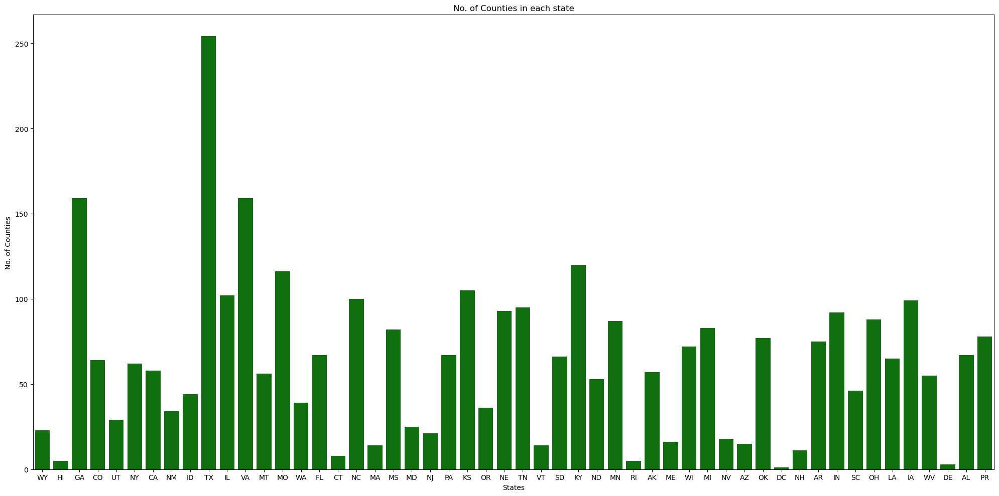

In [33]:
plt.figure(figsize=(20,10))
sn.countplot(x = food_df['StateID'], color = 'g')
plt.title("No. of Counties in each state")
plt.xlabel("States")
plt.ylabel('No. of Counties')
plt.tight_layout()
plt.show()

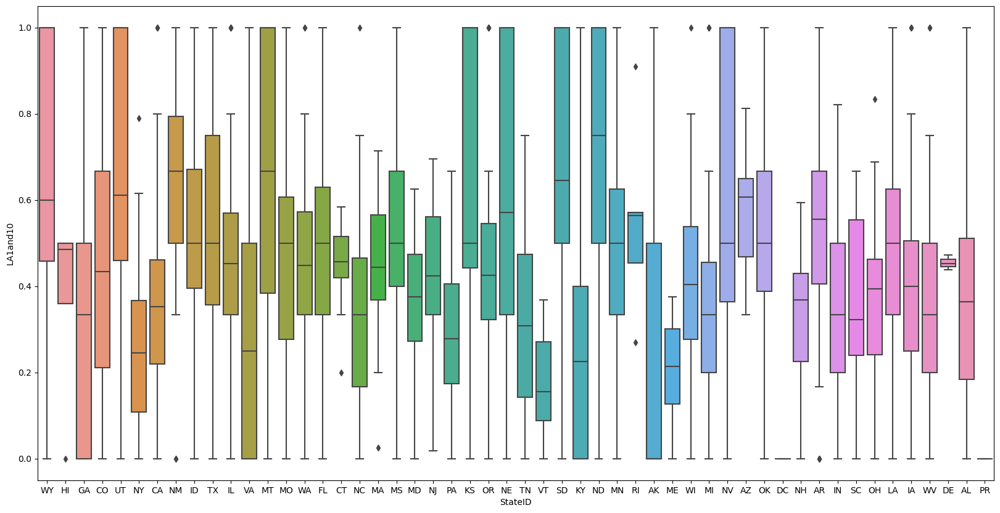

In [34]:
plt.figure(figsize=(20,10))
sn.boxplot(x='StateID', y ='LA1and10', data=food_df, orient='v')
plt.show()

Creating statewise food desert data to create chloropeth maps

In [35]:
def stateData(stateId):
    return food_df.groupby('StateID').get_group(stateId).describe()

In [36]:


stateIDs = food_df.StateID.unique()
data = []
for state in stateIDs:
    state_df = stateData(state)
    Obesity_perc = state_df.loc['mean','Obesity_perc']
    Diabetes_perc = state_df.loc['mean','Diabetes_perc']
    HighCol = state_df.loc['mean','HighCol']
    PovertyRate = state_df.loc['mean','PovertyRate']
    MedianFamilyIncome = state_df.loc['mean','MedianFamilyIncome']
    Lahunv1 = state_df.loc['mean','Lahunv1']
    Lahunv10 = state_df.loc['mean','Lahunv10']
    TotalPopW= state_df.loc['mean','TotalPopW']
    TotalPopB= state_df.loc['mean','TotalPopB']
    CarDisDeathRateB= state_df.loc['mean','CarDisDeathRateB']
    CarDisDeathRateH= state_df.loc['mean','CarDisDeathRateH']
    CarDisDeathRateW= state_df.loc['mean','CarDisDeathRateW']
    LowIncomeTracts = state_df.loc['mean','LowIncomeTracts']
    LA1and10= state_df.loc['mean','LA1and10']
    data.append([state, Obesity_perc, Diabetes_perc, HighCol, PovertyRate,MedianFamilyIncome,Lahunv1,Lahunv10,TotalPopW,TotalPopB,CarDisDeathRateB,CarDisDeathRateH,CarDisDeathRateW,LowIncomeTracts,LA1and10])

states_mean_df = pd.DataFrame(data).rename({0: 'StateID', 1: 'Obesity_perc_mean', 2: 'Diabetes_perc_mean', 3: 'HighCol_mean',4: 'PovertyRate_mean',5: 'MedianFamilyIncome_mean',6: 'Lahunv1_mean',7: 'Lahunv10_mean',8: 'TotalPopW_mean',9: 'TotalPopB_mean',10: 'CarDisDeathRateB_mean',11: 'CarDisDeathRateH_mean',12: 'CarDisDeathRateW_mean',13: 'LowIncomeTracts_mean',14: 'LA1and10_mean'}, axis='columns')
display(states_mean_df.head(5))
#list(states_mean_df.columns.values)

,StateID,Obesity_perc_mean,Diabetes_perc_mean,HighCol_mean,PovertyRate_mean,MedianFamilyIncome_mean,Lahunv1_mean,Lahunv10_mean,TotalPopW_mean,TotalPopB_mean,CarDisDeathRateB_mean,CarDisDeathRateH_mean,CarDisDeathRateW_mean,LowIncomeTracts_mean,LA1and10_mean
0,WY,29.186957,7.952174,34.560870,11.679709,75246.303478,26.079657,7.159422,21233.652174,227.478261,12.204348,96.743478,195.778261,0.185683,0.645961
1,HI,22.280000,8.680000,33.680000,11.164720,91969.408000,33.662320,6.983333,66652.200000,4683.400000,125.680000,232.800000,137.060000,0.216240,0.368920
2,GA,34.774214,12.945912,35.944025,20.591140,55672.904654,64.821063,7.914322,34940.144654,20883.729560,306.540881,61.581761,260.013208,0.650564,0.342264
3,CO,24.465625,6.885938,34.717187,13.131641,70445.334062,25.531969,7.388924,63795.734375,3669.187500,83.851563,142.614063,168.960938,0.586987,0.453223
4,UT,27.931034,8.265517,33.417241,12.069307,71020.924828,21.330186,7.812066,88738.379310,1381.310345,94.572414,92.406897,204.451724,0.322503,0.629079


In [37]:

import pandas as pd
import numpy as np
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

from chart_studio import plotly as py
import plotly.graph_objs as go 


In [38]:
st = states_mean_df 

In [39]:
columnNames = list(st.columns.values)
catColumnNames = ['StateID']
numColumnNames = [i for i  in columnNames if i not in catColumnNames]


In [40]:
for i in numColumnNames:
    data = dict(type = 'choropleth',
            locations = st['StateID'],
            locationmode = 'USA-states',
            colorscale= 'Portland',
            z=st[i],
            colorbar = {'title': i })
    layout = dict(geo = {'scope':'usa'})
    choromap = go.Figure(data = [data],layout = layout)
    iplot(choromap)

In [41]:
columnNames = list(food_df.columns.values)
catColumnNames = ['ID','StateID','County']
numColumnNames = [i for i  in columnNames if i not in catColumnNames]

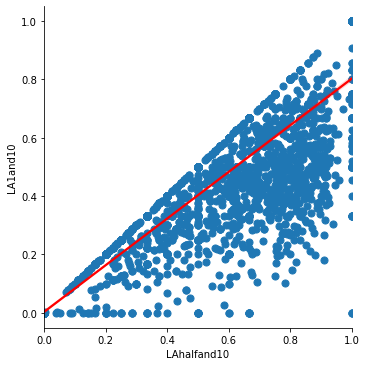

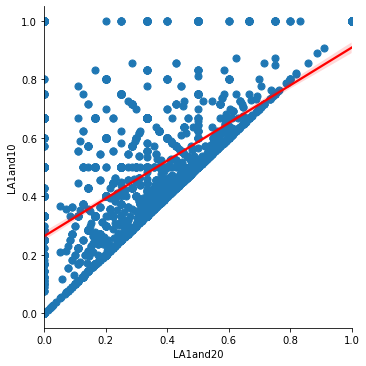

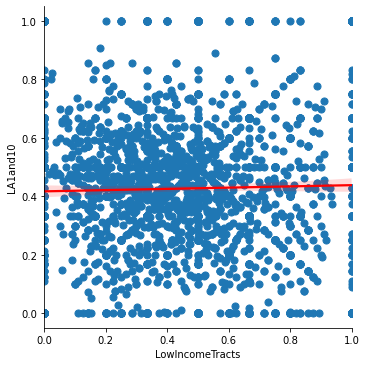

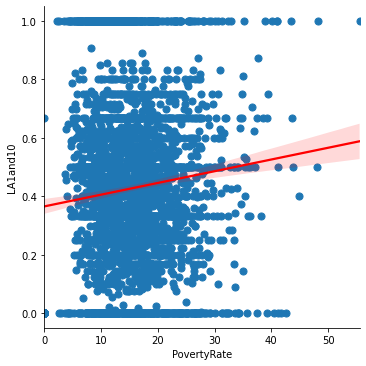

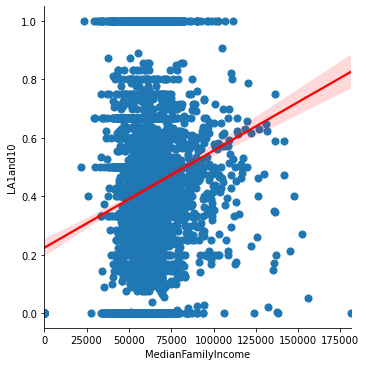

...

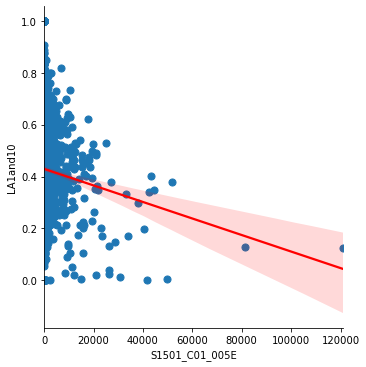

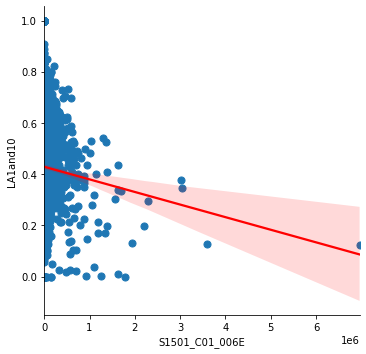

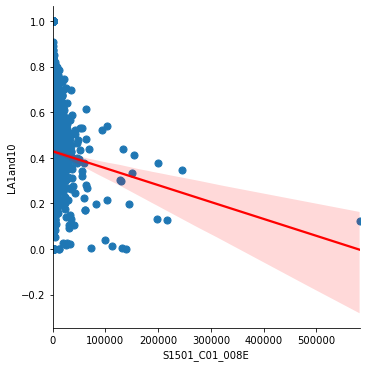

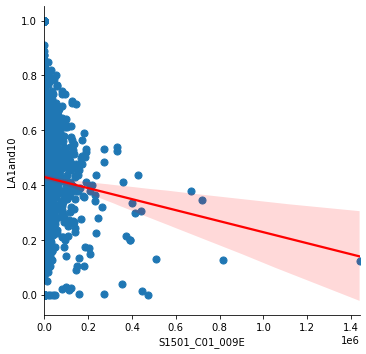

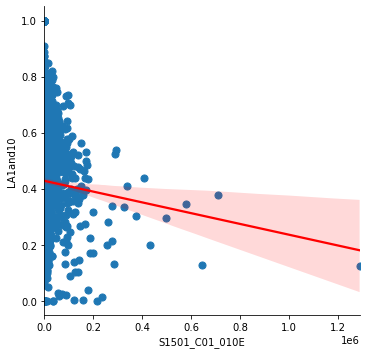

In [42]:
for i in numColumnNames[1:]:
    sn.lmplot(x=i, y="LA1and10", data=food_df, scatter_kws={"s": 50, "alpha": 1}, line_kws={'color': 'red'})
    plt.show()

Chloropeth maps

In [43]:
for i in numColumnNames:
    data = dict(type = 'choropleth',
            locations = food_df['StateID'],
            locationmode = 'USA-states',
            colorscale= 'Portland',
            z=food_df[i],
            colorbar = {'title': i })
    layout = dict(geo = {'scope':'usa'})
    choromap = go.Figure(data = [data],layout = layout)
    iplot(choromap)

# Selecting Most Unhealthy State

In [44]:
def stateData(stateId):
    return food_df.groupby('StateID').get_group(stateId).describe()

stateIDs = food_df.StateID.unique()
data = []
for state in stateIDs:
    state_df = stateData(state)
    Obesity_perc = state_df.loc['mean','Obesity_perc']
    Diabetes_perc = state_df.loc['mean','Diabetes_perc']
    HighCol = state_df.loc['mean','HighCol']
    data.append([state, Obesity_perc, Diabetes_perc, HighCol])

states_mean_df = pd.DataFrame(data).rename({0: 'StateID', 1: 'Obesity_perc_mean', 2: 'Diabetes_perc_mean', 3: 'HighCol_mean'}, axis='columns')
Obesity_perc_mean = states_mean_df.nlargest(5, 'Obesity_perc_mean').drop(['Diabetes_perc_mean', 'HighCol_mean'], axis = 1)
display(Obesity_perc_mean)
Diabetes_perc_mean = states_mean_df.nlargest(5, 'Diabetes_perc_mean').drop(['Obesity_perc_mean', 'HighCol_mean'], axis = 1)
display(Diabetes_perc_mean)
HighCol_mean = states_mean_df.nlargest(5, 'HighCol_mean').drop(['Diabetes_perc_mean', 'Obesity_perc_mean'], axis = 1)
display(HighCol_mean)

,StateID,Obesity_perc_mean
19,MS,40.654878
50,AL,38.202985
48,WV,37.918182
46,LA,37.780000
44,SC,37.610870


,StateID,Diabetes_perc_mean
50,AL,14.868657
19,MS,14.406098
51,PR,14.243590
44,SC,13.604348
42,AR,13.084000


,StateID,HighCol_mean
48,WV,41.201818
29,KY,40.341667
26,TN,40.206316
50,AL,39.998507
39,OK,39.948052


Alabama is ranked 1st in diabetes, 2nd in obesity, and 4th in high cholesterol

# Selecting Most Impoverished State

In [45]:
data = []
for state in stateIDs:
    state_df = stateData(state)
    LI = state_df.loc['mean','LowIncomeTracts']
    PR = state_df.loc['mean','PovertyRate']
    MFI = state_df.loc['mean','MedianFamilyIncome']
    HSGrad = state_df.loc['mean','S1501_C01_009E']
    data.append([state, LI, PR, MFI, HSGrad])

states_mean_df = pd.DataFrame(data).rename({0: 'StateID', 1: 'LI', 2: 'PR', 3: 'MFI', 4: 'HSGrad'}, axis='columns')
LI_mean = states_mean_df.nlargest(5, 'LI').drop(['PR', 'MFI', 'HSGrad'], axis = 1)
display(LI_mean)
PR_mean = states_mean_df.nlargest(5, 'PR').drop(['LI', 'MFI', 'HSGrad'], axis = 1)
display(PR_mean)
MFI_mean = states_mean_df.nsmallest(7, 'MFI').drop(['PR', 'LI', 'HSGrad'], axis = 1)
display(MFI_mean[(MFI_mean != 0).all(1)])
HSGrad_mean = states_mean_df.nsmallest(13, 'HSGrad').drop(['PR', 'MFI', 'LI'], axis = 1)
display(HSGrad_mean[(HSGrad_mean != 0).all(1)])

,StateID,LI
2,GA,0.650564
19,MS,0.643224
7,NM,0.606653
29,KY,0.598582
44,SC,0.597196


,StateID,PR
19,MS,24.831761
46,LA,22.231915
29,KY,21.348583
50,AL,21.212222
2,GA,20.591140


,StateID,MFI
33,AK,37765.550351
19,MS,48290.659878
42,AR,51061.300133
7,NM,52183.165152
50,AL,53212.850746


,StateID,HSGrad
28,SD,817.136364
30,ND,1166.132075
27,VT,1464.285714
25,NE,1607.301075
0,WY,1636.608696
12,MT,2086.642857
23,KS,2587.095238
47,IA,2825.131313
19,MS,2942.524390


Mississippi is 1st in poverty rate, 2nd in low-income, 2nd in lowest median family income, and 9th in amount of high school graduates

# ---------------------------------------------------------------------------------------------------------------

# Exploratory Data Analysis of AL

Querying data for all AL counties

In [46]:
AL_df = food_df[food_df['StateID'] == 'AL']

Creating 2 additional columns to get population % of African American and Caucasion people per county

In [47]:
AL_df['PopB_perc'] = AL_df['TotalPopB']/AL_df['TotalPop']
AL_df['PopW_perc'] = AL_df['TotalPopW']/AL_df['TotalPop']

Alabama's descriptive statistics:

In [48]:
AL_df.describe()

,ID,LA1and10,LAhalfand10,LA1and20,LowIncomeTracts,PovertyRate,MedianFamilyIncome,Lahunv1,Lahunv10,Obesity_perc,...,S1501_C01_002E,S1501_C01_003E,S1501_C01_004E,S1501_C01_005E,S1501_C01_006E,S1501_C01_008E,S1501_C01_009E,S1501_C01_010E,PopB_perc,PopW_perc
count,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,...,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000
mean,12874.522388,0.381255,0.447527,0.200013,0.592978,21.212222,53212.850746,66.352045,15.715043,38.202985,...,592.268657,1761.626866,2385.701493,462.268657,37508.835821,3016.731343,10842.462687,7861.447761,0.280134,0.639376
std,634.580471,0.242814,0.277597,0.187527,0.230499,6.145781,10030.286609,30.480822,19.258816,4.809869,...,1220.172002,3624.923472,5081.237695,1231.341601,78577.088848,5760.873312,22057.661083,16372.184183,0.223275,0.202529
min,11462.000000,0.000000,0.000000,0.000000,0.000000,9.510400,29469.000000,27.122000,0.000000,30.100000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005990,0.166496
25%,12461.500000,0.183350,0.211100,0.000000,0.453300,16.859100,48665.180000,45.744450,2.937500,35.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.100945,0.523285
50%,12902.000000,0.363600,0.444400,0.166700,0.571400,20.690000,51754.670000,60.153800,6.500000,37.100000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.219502,0.692076
75%,13501.500000,0.510400,0.666700,0.325750,0.777800,23.376750,56751.300000,70.350000,20.125000,41.650000,...,919.500000,2102.500000,2755.000000,204.000000,58174.000000,5793.500000,19796.000000,12289.000000,0.418343,0.788661
max,13724.000000,1.000000,1.000000,0.633300,1.000000,40.133300,90509.040000,168.333300,93.000000,51.000000,...,6231.000000,19030.000000,24198.000000,7914.000000,451818.000000,29820.000000,121638.000000,94959.000000,0.808021,0.924384


# AL Correlation Heat Map

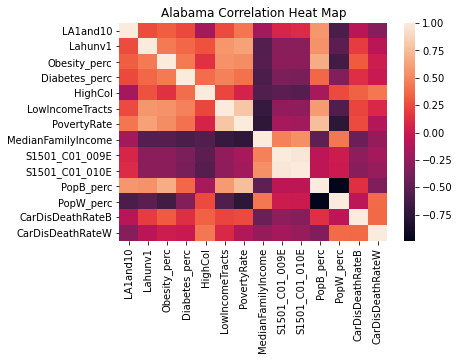

In [49]:
AL_all_df = AL_df[['LA1and10','Lahunv1','Obesity_perc','Diabetes_perc','HighCol','LowIncomeTracts','PovertyRate','MedianFamilyIncome','S1501_C01_009E','S1501_C01_010E','PopB_perc','PopW_perc','CarDisDeathRateB','CarDisDeathRateW']]
corrMatrix = AL_all_df.corr()
sn.heatmap(corrMatrix)
plt.title('Alabama Correlation Heat Map')
plt.savefig('AlabamaHM.png',bbox_inches="tight")
plt.show()

# AL Normality Tests

In [50]:
AL_norm_headers = AL_all_df.columns
Gaussian  = []
non_Gaussian = []
cutoff = 0.05
for col in AL_norm_headers:
    data = np.array(AL_all_df[col])
    stat, p = stats.shapiro(data)
    if p > cutoff:
        Gaussian.append(col)
    else:
        non_Gaussian.append(col)
print('The following samples look Gaussian: ',Gaussian)
print('The following samples do not look Gaussian: ',non_Gaussian)

The following samples look Gaussian:  ['LA1and10', 'LowIncomeTracts', 'CarDisDeathRateB']
The following samples do not look Gaussian:  ['Lahunv1', 'Obesity_perc', 'Diabetes_perc', 'HighCol', 'PovertyRate', 'MedianFamilyIncome', 'S1501_C01_009E', 'S1501_C01_010E', 'PopB_perc', 'PopW_perc', 'CarDisDeathRateW']


Let's do a normality visual check

# AL Gaussian Data Vizualized

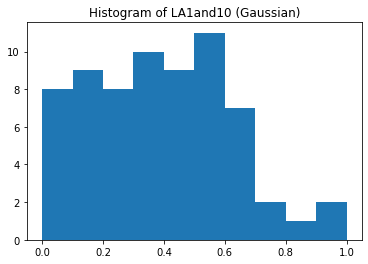

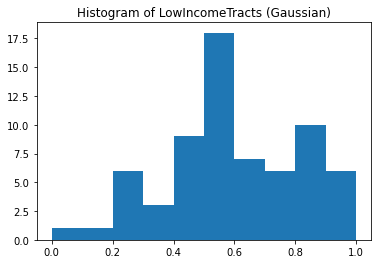

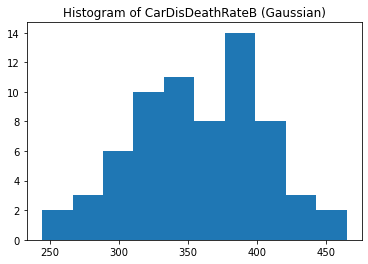

In [51]:
for col in Gaussian:
    data = np.array(AL_all_df[col])
    plt.title('Histogram of '+col+' (Gaussian)')
    plt.hist(data)
    plt.show()

# AL Non-Gaussian Data Vizualized

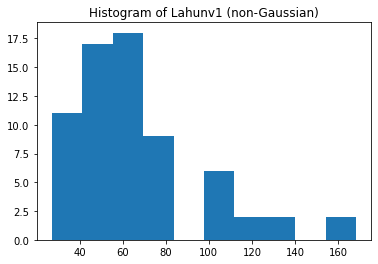

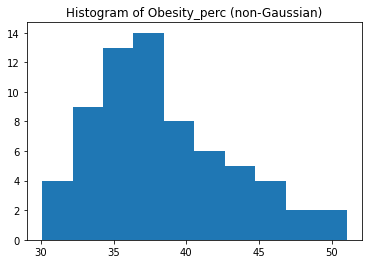

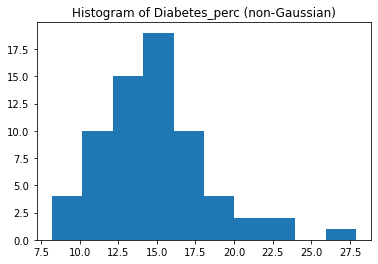

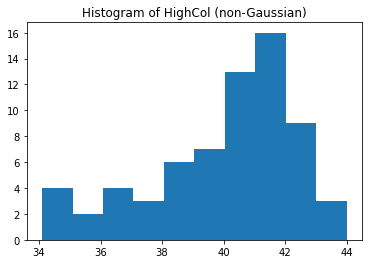

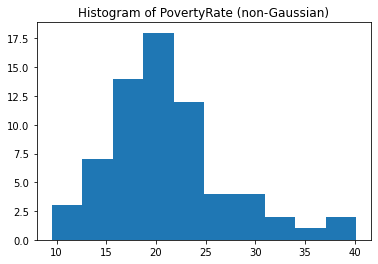

...

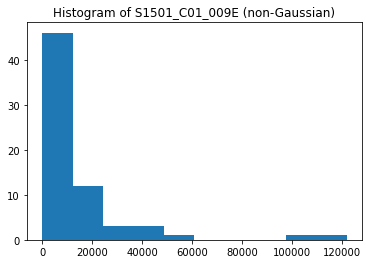

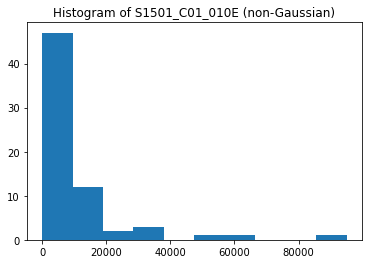

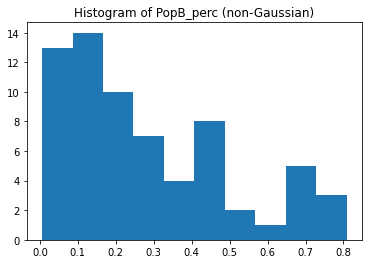

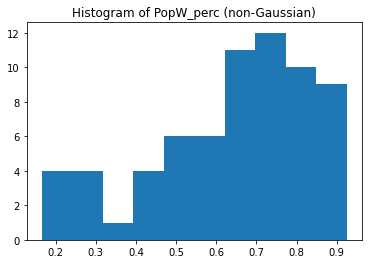

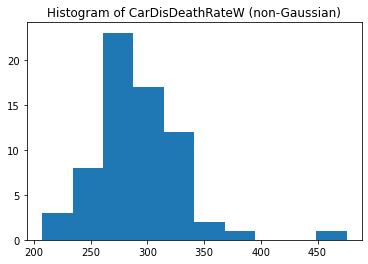

In [52]:
for col in non_Gaussian:
    data = np.array(AL_all_df[col])
    plt.title('Histogram of '+col+' (non-Gaussian)')
    plt.hist(data)
    plt.show()

Shapiro-Wilks test appears accurate

# AL Correlation Tests

Pearson's test for Gaussian samples

In [53]:
for col in Gaussian:
    data1 = np.array(AL_all_df['LA1and10'])
    data2 = np.array(AL_all_df[col])
    corr, _ = stats.pearsonr(data1, data2)
    print('Pearsons correlation for LA1and10 and '+col+': %.3f' % corr)

Pearsons correlation for LA1and10 and LA1and10: 1.000
Pearsons correlation for LA1and10 and LowIncomeTracts: 0.254
Pearsons correlation for LA1and10 and CarDisDeathRateB: -0.085


Spearman's test for non-Gausian samples

In [54]:
for col in non_Gaussian:
    data1 = np.array(AL_all_df['LA1and10'])
    data2 = np.array(AL_all_df[col])
    corr, _ = stats.spearmanr(data1, data2)
    print('Spearmans correlation for LA1and10 and '+col+': %.3f' % corr)

Spearmans correlation for LA1and10 and Lahunv1: 0.077
Spearmans correlation for LA1and10 and Obesity_perc: 0.206
Spearmans correlation for LA1and10 and Diabetes_perc: 0.131
Spearmans correlation for LA1and10 and HighCol: -0.184
Spearmans correlation for LA1and10 and PovertyRate: 0.347
Spearmans correlation for LA1and10 and MedianFamilyIncome: -0.159
Spearmans correlation for LA1and10 and S1501_C01_009E: 0.057
Spearmans correlation for LA1and10 and S1501_C01_010E: 0.067
Spearmans correlation for LA1and10 and PopB_perc: 0.583
Spearmans correlation for LA1and10 and PopW_perc: -0.616
Spearmans correlation for LA1and10 and CarDisDeathRateW: -0.370


# AL Statistical Tests

Set sample size for tests to 30

In [55]:
sample_size = 30

# Statistical Test for Research Q1

Unpaired T-Test will be used since LA1and10 is Guassian

In [56]:
# get food desert data from primarily white counties
AL_primW_df = AL_df.nlargest(sample_size, 'PopW_perc')
# get food desert data from primarily black counties
AL_primB_df = AL_df.nlargest(sample_size, 'PopB_perc')
# ttest
stat, p = stats.ttest_ind(a=AL_primW_df['LA1and10'], b=AL_primB_df['LA1and10'], equal_var=True)
print('Unpaired T-test result for food desert data in primarily white counties and food desert data in primarily black counties: %.3f' % p)
if p < cutoff:
    print('Food desert data in primarily white counties and food desert data in primarily black counties are significantly different from each other')
else:
    print('Food desert data in primarily White counties and food desert data in primarily black counties are similar')

Unpaired T-test result for food desert data in primarily white counties and food desert data in primarily black counties: 0.000
Food desert data in primarily white counties and food desert data in primarily black counties are significantly different from each other


Scatterplots

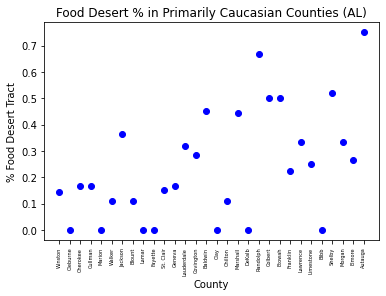

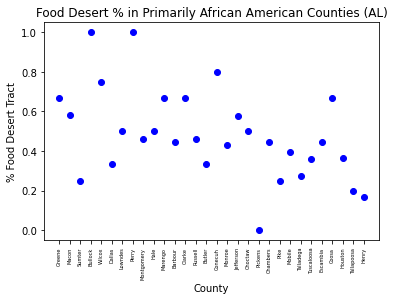

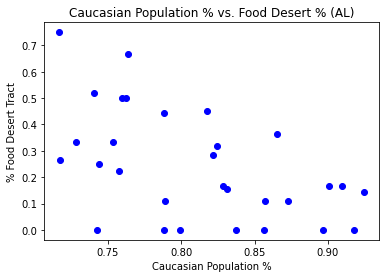

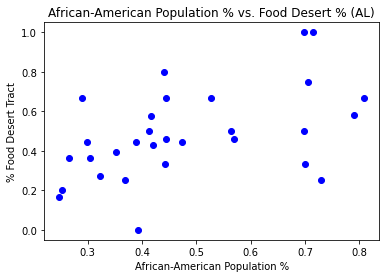

In [57]:
plot1 = plt.figure(1)
plt.plot(AL_primW_df['County'], AL_primW_df['LA1and10'],'bo')
plt.title("Food Desert % in Primarily Caucasian Counties (AL)")
plt.xticks(rotation = 90)
plt.tick_params(axis='x', which='major', labelsize=5)
plt.xlabel('County')
plt.ylabel('% Food Desert Tract')
plt.savefig('ALQ1Plot1.png',bbox_inches="tight")
plt.show()

plot2 = plt.figure(2)
plt.plot(AL_primB_df['County'], AL_primB_df['LA1and10'],'bo')
plt.title("Food Desert % in Primarily African American Counties (AL)")
plt.xticks(rotation = 90)
plt.tick_params(axis='x', which='major', labelsize=5)
plt.xlabel('County')
plt.ylabel('% Food Desert Tract')
plt.savefig('ALQ1Plot2.png',bbox_inches="tight")
plt.show()

plot3 = plt.figure(3)
plt.plot(AL_primW_df['PopW_perc'], AL_primW_df['LA1and10'],'bo')
plt.title("Caucasian Population % vs. Food Desert % (AL)")
plt.xlabel('Caucasian Population %')
plt.ylabel('% Food Desert Tract')
plt.savefig('ALQ1Plot3.png',bbox_inches="tight")
plt.show()

plot4 = plt.figure(4)
plt.plot(AL_primB_df['PopB_perc'], AL_primB_df['LA1and10'],'bo')
plt.title("African-American Population % vs. Food Desert % (AL)")
plt.xlabel('African-American Population %')
plt.ylabel('% Food Desert Tract')
plt.savefig('ALQ1Plot4.png',bbox_inches="tight")
plt.show()

# Statistical Test for Research Q2

Unpaired T-Test will be used since LA1and10 is Guassian

In [58]:
# get food desert data from counties w/ higher diabetes %
AL_diabetes_top_df = AL_df.nlargest(sample_size, 'Diabetes_perc')
# get food desert data from counties w/ lower diabetes %
AL_diabetes_low_df = AL_df.nsmallest(sample_size, 'Diabetes_perc')
# ttest
stat, p = stats.ttest_ind(a=AL_diabetes_top_df['LA1and10'], b=AL_diabetes_low_df['LA1and10'], equal_var=True)
print('Unpaired T-test result for food desert data in counties with high diabetes perc and food desert data in counties with low diabetes perc: %.3f' % p)
if p < cutoff:
    print('Food desert data in counties with high diabetes % and food desert data in counties with low diabetes % are significantly different from each other')
else:
    print('Food desert data in counties with high diabetes % and food desert data in counties with low diabetes % are similar')

Unpaired T-test result for food desert data in counties with high diabetes perc and food desert data in counties with low diabetes perc: 0.067
Food desert data in counties with high diabetes % and food desert data in counties with low diabetes % are similar


In [59]:
# get food desert data from counties w/ higher highcol %
AL_highcol_top_df = AL_df.nlargest(sample_size, 'HighCol')
# get food desert data from counties w/ lower highcol %
AL_highcol_low_df = AL_df.nsmallest(sample_size, 'HighCol')
# ttest
stat, p = stats.ttest_ind(a=AL_highcol_top_df['LA1and10'], b=AL_highcol_low_df['LA1and10'], equal_var=True)
print('Unpaired T-test result for food desert data in counties with high highcol perc and food desert data in counties with low highcol perc: %.3f' % p)
if p < cutoff:
    print('Food desert data in counties with high highcol % and food desert data in counties with low highcol % are significantly different from each other')
else:
    print('Food desert data in counties with high highcol % and food desert data in counties with low highcol % are similar')

Unpaired T-test result for food desert data in counties with high highcol perc and food desert data in counties with low highcol perc: 0.409
Food desert data in counties with high highcol % and food desert data in counties with low highcol % are similar


In [60]:
# get food desert data from counties w/ higher obesity %
AL_obesity_top_df = AL_all_df.nlargest(sample_size, 'Obesity_perc')
# get food desert data from counties w/ lower obesity %
AL_obesity_low_df = AL_all_df.nsmallest(sample_size, 'Obesity_perc')
# ttest
stat, p = stats.ttest_ind(a=AL_obesity_top_df['LA1and10'], b=AL_obesity_low_df['LA1and10'], equal_var=True)
print('Unpaired T-test result for food desert data in counties with high obesity perc and food desert data in counties with low obesity perc: %.3f' % p)
if p < cutoff:
    print('Food desert data in counties with high obesity % and food desert data in counties with low obesity % are significantly different from each other')
else:
    print('Food desert data in counties with high obesity % and food desert data in counties with low obesity % are similar')

Unpaired T-test result for food desert data in counties with high obesity perc and food desert data in counties with low obesity perc: 0.206
Food desert data in counties with high obesity % and food desert data in counties with low obesity % are similar


Scatterplots

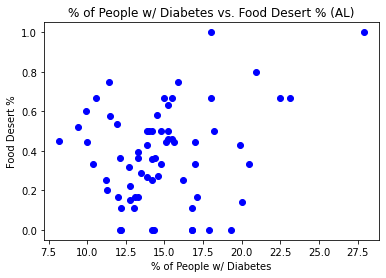

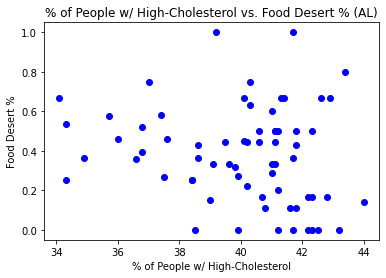

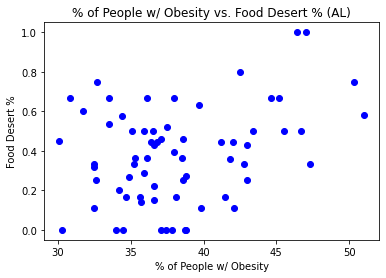

In [61]:
plot1 = plt.figure(1)
plt.plot(AL_df['Diabetes_perc'], AL_df['LA1and10'],'bo')
plt.title("% of People w/ Diabetes vs. Food Desert % (AL)")
# plt.xticks(rotation = 90)
plt.xlabel('% of People w/ Diabetes')
plt.ylabel('Food Desert %')
# plt.tick_params(axis='x', which='major', labelsize=5)
plt.savefig('ALQ2Plot1.png',bbox_inches="tight")
plt.show()

plot2 = plt.figure(2)
plt.plot(AL_df['HighCol'], AL_df['LA1and10'],'bo')
plt.title("% of People w/ High-Cholesterol vs. Food Desert % (AL)")
# plt.xticks(rotation = 90)
plt.xlabel('% of People w/ High-Cholesterol')
plt.ylabel('Food Desert %')
# plt.tick_params(axis='x', which='major', labelsize=5)
plt.savefig('ALQ2Plot2.png',bbox_inches="tight")
plt.show()

plot3 = plt.figure(3)
plt.plot(AL_df['Obesity_perc'], AL_df['LA1and10'],'bo')
plt.title("% of People w/ Obesity vs. Food Desert % (AL)")
# plt.xticks(rotation = 90)
plt.xlabel('% of People w/ Obesity')
plt.ylabel('Food Desert %')
# plt.tick_params(axis='x', which='major', labelsize=5)
plt.savefig('ALQ2Plot3.png',bbox_inches="tight")
plt.show()

# Statistical Test for Research Q3

Mann Whitney U-Test will be used since Obesity_perc, Diabetes_perc, and HighCol is non-Guassian

In [62]:
# get food desert data from counties w/ higher Lahunv1
AL_Lahunv1_top_df = AL_all_df.nlargest(sample_size, 'Lahunv1')
# get food desert data from counties w/ lower Lahunv1
AL_Lahunv1_low_df = AL_all_df.nsmallest(sample_size, 'Lahunv1')
# mannwhitneyu
stat, p = stats.mannwhitneyu(x=AL_Lahunv1_top_df['Obesity_perc'], y=AL_Lahunv1_low_df['Obesity_perc'], alternative = 'two-sided')
print('Mann Whitney U-test result for obesity in counties with high Lahunv1 and obesity data in counties with low Lahunv1: %.3f' % p)
if p < cutoff:
    print('Obesity data in counties with high Lahunv1 and obesity data in counties with low Lahunv1 are significantly different from each other')
else:
    print('Obesity data in counties with high Lahunv1 and obesity data in counties with low Lahunv1 are similar')

Mann Whitney U-test result for obesity in counties with high Lahunv1 and obesity data in counties with low Lahunv1: 0.068
Obesity data in counties with high Lahunv1 and obesity data in counties with low Lahunv1 are similar


In [63]:
# mannwhitneyu
stat, p = stats.mannwhitneyu(x=AL_Lahunv1_top_df['Diabetes_perc'], y=AL_Lahunv1_low_df['Diabetes_perc'], alternative = 'two-sided')
print('Mann Whitney U-test result for diabetes in counties with high Lahunv1 and diabetes data in counties with low Lahunv1: %.3f' % p)
if p < cutoff:
    print('Diabetes data in counties with high Lahunv1 and diabetes data in counties with low Lahunv1 are significantly different from each other')
else:
    print('Diabetes data in counties with high Lahunv1 and diabetes data in counties with low Lahunv1 are similar')

Mann Whitney U-test result for diabetes in counties with high Lahunv1 and diabetes data in counties with low Lahunv1: 0.008
Diabetes data in counties with high Lahunv1 and diabetes data in counties with low Lahunv1 are significantly different from each other


In [64]:
# mannwhitneyu
stat, p = stats.mannwhitneyu(x=AL_Lahunv1_top_df['HighCol'], y=AL_Lahunv1_low_df['HighCol'], alternative = 'two-sided')
print('Mann Whitney U-test result for HighCol in counties with high Lahunv1 and HighCol data in counties with low Lahunv1: %.3f' % p)
if p < cutoff:
    print('HighCol data in counties with high Lahunv1 and HighCol data in counties with low Lahunv1 are significantly different from each other')
else:
    print('HighCol data in counties with high Lahunv1 and HighCol data in counties with low Lahunv1 are similar')


Mann Whitney U-test result for HighCol in counties with high Lahunv1 and HighCol data in counties with low Lahunv1: 0.057
HighCol data in counties with high Lahunv1 and HighCol data in counties with low Lahunv1 are similar


Scatterplots

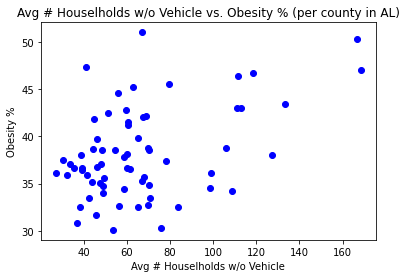

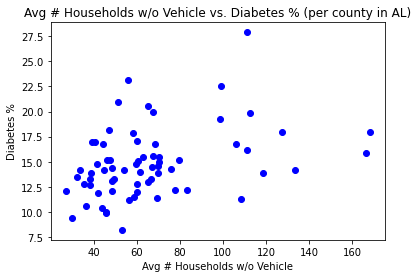

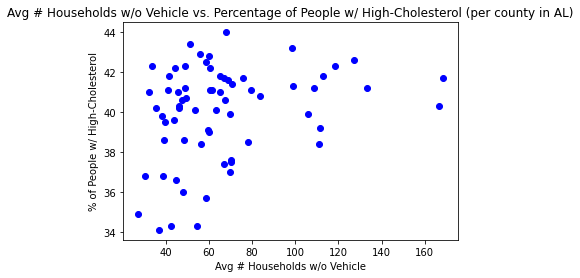

In [65]:
plot1 = plt.figure(1)
plt.plot(AL_df['Lahunv1'], AL_df['Obesity_perc'],'bo')
plt.title("Avg # Houselholds w/o Vehicle vs. Obesity % (per county in AL)")
plt.xlabel('Avg # Houselholds w/o Vehicle')
plt.ylabel('Obesity %')
plt.savefig('ALQ3Plot1.png',bbox_inches="tight")
plt.show()

plot2 = plt.figure(2)
plt.plot(AL_df['Lahunv1'], AL_df['Diabetes_perc'],'bo')
plt.title("Avg # Households w/o Vehicle vs. Diabetes % (per county in AL)")
plt.xlabel('Avg # Households w/o Vehicle')
plt.ylabel('Diabetes %')
plt.savefig('ALQ3Plot2.png',bbox_inches="tight")
plt.show()

plot3 = plt.figure(3)
plt.plot(AL_df['Lahunv1'], AL_df['HighCol'],'bo')
plt.title("Avg # Households w/o Vehicle vs. Percentage of People w/ High-Cholesterol (per county in AL)")
plt.xlabel('Avg # Households w/o Vehicle')
plt.ylabel('% of People w/ High-Cholesterol')
plt.savefig('ALQ3Plot3.png',bbox_inches="tight")
plt.show()

# Statistical Test for Research Q4

Unpaired T-Test will be used since LA1and10 is Guassian

In [66]:
# get food desert data from counties w/ higher poverty rate
AL_poverty_top_df = AL_df.nlargest(sample_size, 'PovertyRate')
# get food desert data from counties w/ lower poverty rate
AL_poverty_low_df = AL_df.nsmallest(sample_size, 'PovertyRate')
# ttest
stat, p = stats.ttest_ind(a=AL_poverty_top_df['LA1and10'], b=AL_poverty_low_df['LA1and10'], equal_var=True)
print('Unpaired T-test result for food deserts in counties with high poverty rates and food deserts data in counties with low poverty rates: %.3f' % p)
if p < cutoff:
    print('Food deserts in counties with high poverty rates and food deserts in counties with low poverty rates are significantly different from each other')
else:
    print('Food deserts in counties with high poverty rates and food deserts in counties with low poverty rates are similar')

Unpaired T-test result for food deserts in counties with high poverty rates and food deserts data in counties with low poverty rates: 0.005
Food deserts in counties with high poverty rates and food deserts in counties with low poverty rates are significantly different from each other


Scatterplot

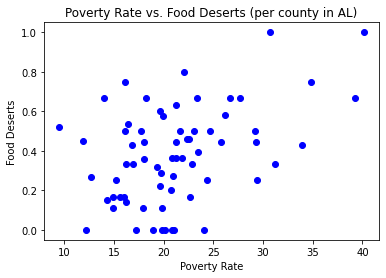

In [67]:
plot1 = plt.figure(1)
plt.plot(AL_df['PovertyRate'], AL_df['LA1and10'],'bo')
plt.title("Poverty Rate vs. Food Deserts (per county in AL)")
plt.xlabel('Poverty Rate')
plt.ylabel('Food Deserts')
plt.savefig('ALQ4Plot1.png',bbox_inches="tight")
plt.show()

# ---------------------------------------------------------------------------------------------------------------

# Exploratory Data Analysis of MS

Querying data for all MS counties

In [68]:
MS_df = food_df[food_df['StateID'] == 'MS']

Creating 2 additional columns to get population % of African American and Caucasion people per county

In [69]:
MS_df['PopB_perc'] = MS_df['TotalPopB']/MS_df['TotalPop']
MS_df['PopW_perc'] = MS_df['TotalPopW']/MS_df['TotalPop']

Mississippi's descriptive statistics:

In [70]:
MS_df.describe()

,ID,LA1and10,LAhalfand10,LA1and20,LowIncomeTracts,PovertyRate,MedianFamilyIncome,Lahunv1,Lahunv10,Obesity_perc,...,S1501_C01_002E,S1501_C01_003E,S1501_C01_004E,S1501_C01_005E,S1501_C01_006E,S1501_C01_008E,S1501_C01_009E,S1501_C01_010E,PopB_perc,PopW_perc
count,82.000000,82.000000,82.000000,82.000000,82.000000,82.000000,82.000000,82.000000,82.000000,82.000000,...,82.000000,82.000000,82.000000,82.000000,82.000000,82.000000,82.000000,82.000000,82.000000,82.000000
mean,13168.451220,0.544460,0.610874,0.219417,0.643224,24.831761,48290.659878,79.332593,23.473414,40.654878,...,207.536585,428.560976,796.439024,137.890244,10791.853659,880.268293,2942.524390,2511.829268,0.406285,0.537087
std,589.255403,0.262716,0.266329,0.207831,0.284227,7.732013,10754.334866,31.304831,25.752090,5.623543,...,643.124879,1378.623576,2436.125953,425.177581,32013.272105,2570.394657,8750.451517,7740.344704,0.210654,0.198425
min,10665.000000,0.000000,0.000000,0.000000,0.000000,10.340700,21445.000000,20.578900,0.000000,21.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.023024,0.106623
25%,12934.250000,0.400000,0.432550,0.000000,0.500000,18.849975,41791.960000,59.700000,7.937500,37.300000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.251221,0.395666
50%,13383.000000,0.500000,0.666700,0.200000,0.666700,23.564300,47278.835000,74.250000,17.250000,40.250000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.360085,0.569866
75%,13612.000000,0.666700,0.797375,0.333300,0.875000,28.870825,53656.037500,90.249975,27.950000,43.450000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.567631,0.661531
max,13729.000000,1.000000,1.000000,0.688900,1.000000,48.000000,88186.570000,205.500000,130.333300,53.500000,...,3287.000000,7931.000000,12614.000000,2157.000000,151101.000000,12443.000000,41518.000000,39632.000000,0.874548,0.920371


# MS Correlation Heat Map

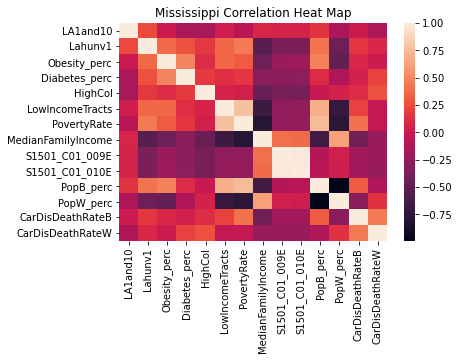

In [71]:
MS_all_df = MS_df[['LA1and10','Lahunv1','Obesity_perc','Diabetes_perc','HighCol','LowIncomeTracts','PovertyRate','MedianFamilyIncome','S1501_C01_009E','S1501_C01_010E','PopB_perc','PopW_perc','CarDisDeathRateB','CarDisDeathRateW']]
corrMatrix = MS_all_df.corr()
sn.heatmap(corrMatrix)
plt.title('Mississippi Correlation Heat Map')
plt.savefig('MississippiHM.png',bbox_inches="tight")
plt.show()

# MS Normality Tests

In [72]:
MS_norm_headers = MS_all_df.columns
Gaussian  = []
non_Gaussian = []
cutoff = 0.05
for col in MS_norm_headers:
    data = np.array(MS_all_df[col])
    stat, p = stats.shapiro(data)
    if p > cutoff:
        Gaussian.append(col)
    else:
        non_Gaussian.append(col)
print('The following samples look Gaussian: ',Gaussian)
print('The following samples do not look Gaussian: ',non_Gaussian)

The following samples look Gaussian:  ['PopW_perc', 'CarDisDeathRateW']
The following samples do not look Gaussian:  ['LA1and10', 'Lahunv1', 'Obesity_perc', 'Diabetes_perc', 'HighCol', 'LowIncomeTracts', 'PovertyRate', 'MedianFamilyIncome', 'S1501_C01_009E', 'S1501_C01_010E', 'PopB_perc', 'CarDisDeathRateB']


Let's do another normality visual check

# MS Gaussian Data Vizualized

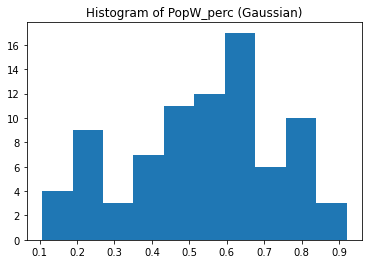

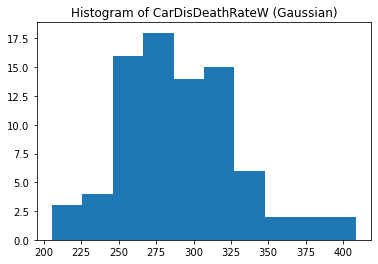

In [73]:
for col in Gaussian:
    data = np.array(MS_all_df[col])
    plt.title('Histogram of '+col+' (Gaussian)')
    plt.hist(data)
    plt.show()

# MS Non-Gaussian Data Vizualized

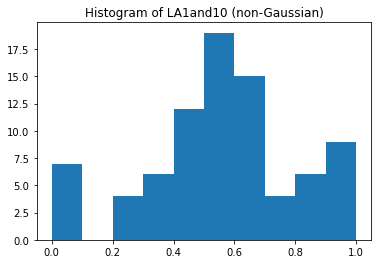

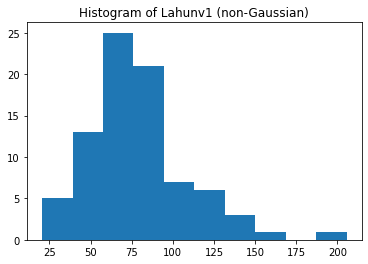

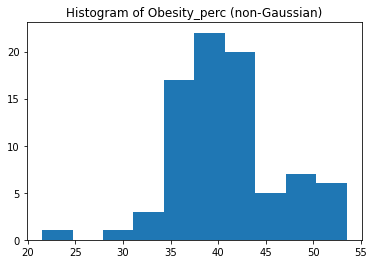

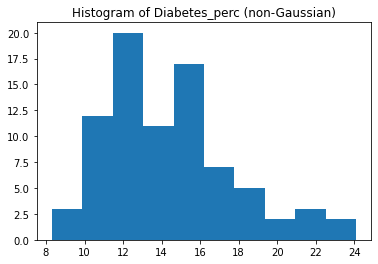

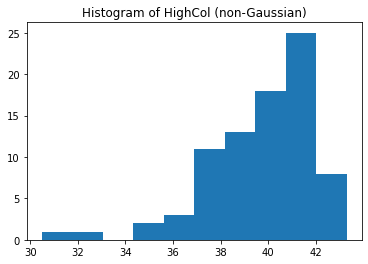

...

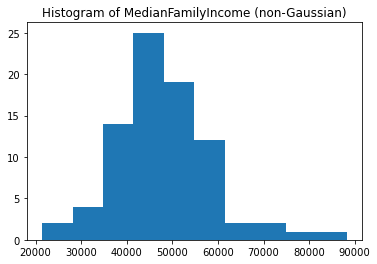

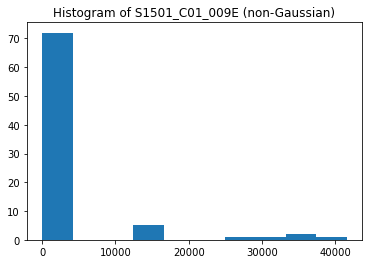

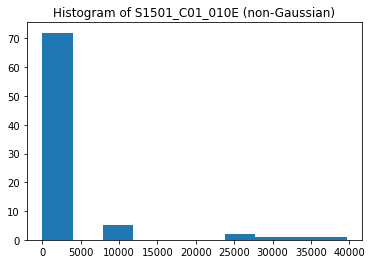

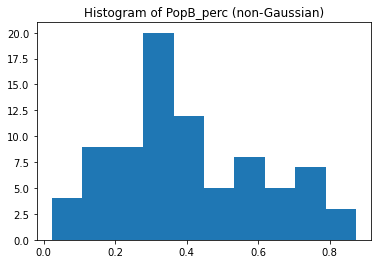

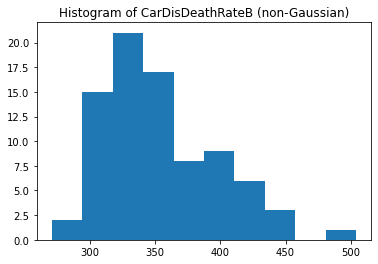

In [74]:
for col in non_Gaussian:
    data = np.array(MS_all_df[col])
    plt.title('Histogram of '+col+' (non-Gaussian)')
    plt.hist(data)
    plt.show()

Shapiro-Wilks test appears accurate

# MS Correlation Tests

Pearson's test for Gaussian samples

In [75]:
for col in Gaussian:
    data1 = np.array(MS_all_df['LA1and10'])
    data2 = np.array(MS_all_df[col])
    corr, _ = stats.pearsonr(data1, data2)
    print('Pearsons correlation for LA1and10 and '+col+': %.3f' % corr)

Pearsons correlation for LA1and10 and PopW_perc: -0.139
Pearsons correlation for LA1and10 and CarDisDeathRateW: -0.138


Spearman's test for non-Gausian samples

In [76]:
for col in non_Gaussian:
    data1 = np.array(MS_all_df['LA1and10'])
    data2 = np.array(MS_all_df[col])
    corr, _ = stats.spearmanr(data1, data2)
    print('Spearmans correlation for LA1and10 and '+col+': %.3f' % corr)

Spearmans correlation for LA1and10 and LA1and10: 1.000
Spearmans correlation for LA1and10 and Lahunv1: 0.200
Spearmans correlation for LA1and10 and Obesity_perc: -0.043
Spearmans correlation for LA1and10 and Diabetes_perc: -0.182
Spearmans correlation for LA1and10 and HighCol: -0.188
Spearmans correlation for LA1and10 and LowIncomeTracts: 0.030
Spearmans correlation for LA1and10 and PovertyRate: -0.060
Spearmans correlation for LA1and10 and MedianFamilyIncome: 0.084
Spearmans correlation for LA1and10 and S1501_C01_009E: 0.044
Spearmans correlation for LA1and10 and S1501_C01_010E: 0.049
Spearmans correlation for LA1and10 and PopB_perc: 0.172
Spearmans correlation for LA1and10 and CarDisDeathRateB: -0.045


# MS Statistical Tests

# Statistical Test for Research Q1

Mann Whitney U-Test will be used since LA1and10 is non-Guassian

In [77]:
# get food desert data from primarily white counties
MS_primW_df = MS_df.nlargest(sample_size, 'PopW_perc')
# get food desert data from primarily black counties
MS_primB_df = MS_df.nlargest(sample_size, 'PopB_perc')
# mannwhitneyu
stat, p = stats.mannwhitneyu(x=MS_primW_df['LA1and10'], y=MS_primB_df['LA1and10'], alternative = 'two-sided')
print('Mann Whitney U-test result for food desert data in primarily white counties and food desert data in primarily black counties: %.3f' % p)
if p < cutoff:
    print('Food desert data in primarily white counties and food desert data in primarily black counties are significantly different from each other')
else:
    print('Food desert data in primarily White counties and food desert data in primarily black counties are similar')

Mann Whitney U-test result for food desert data in primarily white counties and food desert data in primarily black counties: 0.376
Food desert data in primarily White counties and food desert data in primarily black counties are similar


Scatterplots

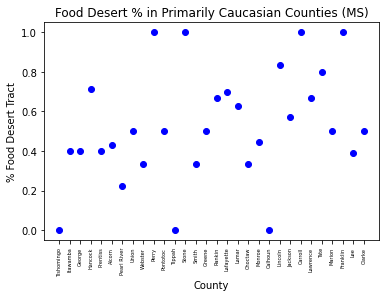

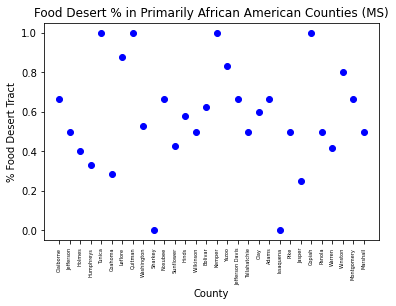

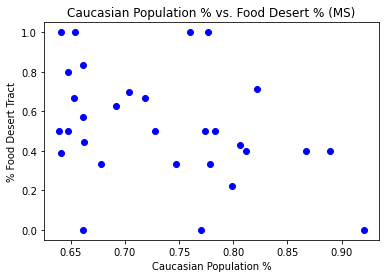

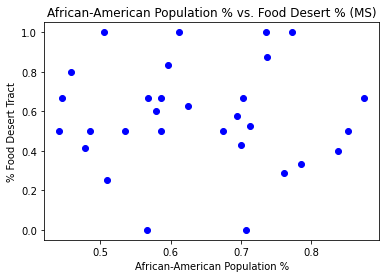

In [78]:
plot1 = plt.figure(1)
plt.plot(MS_primW_df['County'], MS_primW_df['LA1and10'],'bo')
plt.title("Food Desert % in Primarily Caucasian Counties (MS)")
plt.xticks(rotation = 90)
plt.tick_params(axis='x', which='major', labelsize=5)
plt.xlabel('County')
plt.ylabel('% Food Desert Tract')
plt.savefig('MSQ1Plot1.png',bbox_inches="tight")
plt.show()

plot2 = plt.figure(2)
plt.plot(MS_primB_df['County'], MS_primB_df['LA1and10'],'bo')
plt.title("Food Desert % in Primarily African American Counties (MS)")
plt.xticks(rotation = 90)
plt.tick_params(axis='x', which='major', labelsize=5)
plt.xlabel('County')
plt.ylabel('% Food Desert Tract')
plt.savefig('MSQ1Plot2.png',bbox_inches="tight")
plt.show()

plot3 = plt.figure(3)
plt.plot(MS_primW_df['PopW_perc'], MS_primW_df['LA1and10'],'bo')
plt.title("Caucasian Population % vs. Food Desert % (MS)")
plt.xlabel('Caucasian Population %')
plt.ylabel('% Food Desert Tract')
plt.savefig('MSQ1Plot3.png',bbox_inches="tight")
plt.show()

plot4 = plt.figure(4)
plt.plot(MS_primB_df['PopB_perc'], MS_primB_df['LA1and10'],'bo')
plt.title("African-American Population % vs. Food Desert % (MS)")
plt.xlabel('African-American Population %')
plt.ylabel('% Food Desert Tract')
plt.savefig('MSQ1Plot4.png',bbox_inches="tight")
plt.show()

# Statistical Test for Research Q2

Mann Whitney U-Test will be used since LA1and10 is non-Guassian

In [79]:
# get food desert data from counties w/ higher diabetes %
MS_diabetes_top_df = MS_df.nlargest(sample_size, 'Diabetes_perc')
# get food desert data from counties w/ lower diabetes %
MS_diabetes_low_df = MS_df.nsmallest(sample_size, 'Diabetes_perc')
# mannwhitneyu
stat, p = stats.mannwhitneyu(x=MS_diabetes_top_df['LA1and10'], y=MS_diabetes_low_df['LA1and10'], alternative = 'two-sided')
print('Mann Whitney U-test result for food desert data in counties with high diabetes perc and food desert data in counties with low diabetes perc: %.3f' % p)
if p < cutoff:
    print('Food desert data in counties with high diabetes % and food desert data in counties with low diabetes % are significantly different from each other')
else:
    print('Food desert data in counties with high diabetes % and food desert data in counties with low diabetes % are similar')

Mann Whitney U-test result for food desert data in counties with high diabetes perc and food desert data in counties with low diabetes perc: 0.194
Food desert data in counties with high diabetes % and food desert data in counties with low diabetes % are similar


In [80]:
# get food desert data from counties w/ higher highcol %
MS_highcol_top_df = MS_df.nlargest(sample_size, 'HighCol')
# get food desert data from counties w/ lower highcol %
MS_highcol_low_df = MS_df.nsmallest(sample_size, 'HighCol')
# mannwhitneyu
stat, p = stats.mannwhitneyu(x=MS_highcol_top_df['LA1and10'], y=MS_highcol_low_df['LA1and10'], alternative = 'two-sided')
print('Mann Whitney U-test result for food desert data in counties with high highcol perc and food desert data in counties with low highcol perc: %.3f' % p)
if p < cutoff:
    print('Food desert data in counties with high highcol % and food desert data in counties with low highcol % are significantly different from each other')
else:
    print('Food desert data in counties with high highcol % and food desert data in counties with low highcol % are similar')

Mann Whitney U-test result for food desert data in counties with high highcol perc and food desert data in counties with low highcol perc: 0.101
Food desert data in counties with high highcol % and food desert data in counties with low highcol % are similar


In [81]:
# get food desert data from counties w/ higher obesity %
MS_obesity_top_df = MS_df.nlargest(sample_size, 'Obesity_perc')
# get food desert data from counties w/ lower obesity %
MS_obesity_low_df = MS_df.nsmallest(sample_size, 'Obesity_perc')
# mannwhitneyu
stat, p = stats.mannwhitneyu(x=MS_obesity_top_df['LA1and10'], y=MS_obesity_low_df['LA1and10'], alternative = 'two-sided')
print('Mann Whitney U-test result for food desert data in counties with high obesity perc and food desert data in counties with low obesity perc: %.3f' % p)
if p < cutoff:
    print('Food desert data in counties with high obesity % and food desert data in counties with low obesity % are significantly different from each other')
else:
    print('Food desert data in counties with high obesity % and food desert data in counties with low obesity % are similar')

Mann Whitney U-test result for food desert data in counties with high obesity perc and food desert data in counties with low obesity perc: 0.801
Food desert data in counties with high obesity % and food desert data in counties with low obesity % are similar


Scatterplots

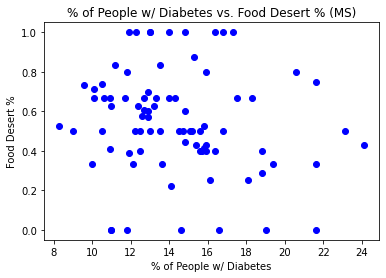

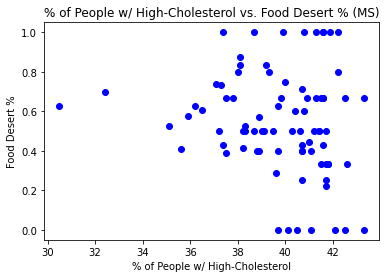

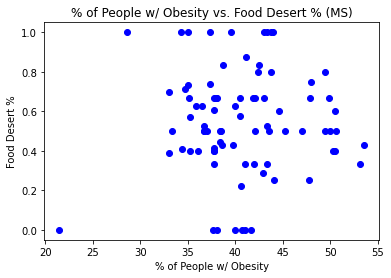

In [82]:
plot1 = plt.figure(1)
plt.plot(MS_df['Diabetes_perc'], MS_df['LA1and10'],'bo')
plt.title("% of People w/ Diabetes vs. Food Desert % (MS)")
plt.xlabel('% of People w/ Diabetes')
plt.ylabel('Food Desert %')
plt.savefig('MSQ2Plot1.png',bbox_inches="tight")
plt.show()

plot2 = plt.figure(2)
plt.plot(MS_df['HighCol'], MS_df['LA1and10'],'bo')
plt.title("% of People w/ High-Cholesterol vs. Food Desert % (MS)")
plt.xlabel('% of People w/ High-Cholesterol')
plt.ylabel('Food Desert %')
plt.savefig('MSQ2Plot2.png',bbox_inches="tight")
plt.show()

plot3 = plt.figure(3)
plt.plot(MS_df['Obesity_perc'], MS_df['LA1and10'],'bo')
plt.title("% of People w/ Obesity vs. Food Desert % (MS)")
plt.xlabel('% of People w/ Obesity')
plt.ylabel('Food Desert %')
plt.savefig('MSQ2Plot3.png',bbox_inches="tight")
plt.show()

# Statistical Test for Research Q3

Mann Whitney U-Test will be used since Obesity_perc, Diabetes_perc and HighCol are non-Guassian

In [83]:
# get food desert data from counties w/ higher Lahunv1
MS_Lahunv1_top_df = MS_df.nlargest(sample_size, 'Lahunv1')
# get food desert data from counties w/ lower Lahunv1
MS_Lahunv1_low_df = MS_df.nsmallest(sample_size, 'Lahunv1')
# mannwhitneyu
stat, p = stats.mannwhitneyu(x=MS_Lahunv1_top_df['Obesity_perc'], y=MS_Lahunv1_low_df['Obesity_perc'], alternative = 'two-sided')
print('Mann Whitney U-test result for obesity in counties with high Lahunv1 and obesity data in counties with low Lahunv1: %.3f' % p)
if p < cutoff:
    print('Obesity data in counties with high Lahunv1 and obesity data in counties with low Lahunv1 are significantly different from each other')
else:
    print('Obesity desert data in counties with high Lahunv1 and obesity data in counties with low Lahunv1 are similar')

Mann Whitney U-test result for obesity in counties with high Lahunv1 and obesity data in counties with low Lahunv1: 0.001
Obesity data in counties with high Lahunv1 and obesity data in counties with low Lahunv1 are significantly different from each other


In [84]:
# mannwhitneyu
stat, p = stats.mannwhitneyu(x=MS_Lahunv1_top_df['Diabetes_perc'], y=MS_Lahunv1_low_df['Diabetes_perc'], alternative = 'two-sided')
print('Mann Whitney U-test result for diabetes in counties with high Lahunv1 and diabetes data in counties with low Lahunv1: %.3f' % p)
if p < cutoff:
    print('Diabetes data in counties with high Lahunv1 and diabetes data in counties with low Lahunv1 are significantly different from each other')
else:
    print('Diabetes desert data in counties with high Lahunv1 and diabetes data in counties with low Lahunv1 are similar')

Mann Whitney U-test result for diabetes in counties with high Lahunv1 and diabetes data in counties with low Lahunv1: 0.024
Diabetes data in counties with high Lahunv1 and diabetes data in counties with low Lahunv1 are significantly different from each other


In [85]:
# mannwhitneyu
stat, p = stats.mannwhitneyu(x=MS_Lahunv1_top_df['HighCol'], y=MS_Lahunv1_low_df['HighCol'], alternative = 'two-sided')
print('Mann Whitney U-test result for HighCol in counties with high Lahunv1 and HighCol data in counties with low Lahunv1: %.3f' % p)
if p < cutoff:
    print('HighCol data in counties with high Lahunv1 and HighCol data in counties with low Lahunv1 are significantly different from each other')
else:
    print('HighCol desert data in counties with high Lahunv1 and HighCol data in counties with low Lahunv1 are similar')

Mann Whitney U-test result for HighCol in counties with high Lahunv1 and HighCol data in counties with low Lahunv1: 0.294
HighCol desert data in counties with high Lahunv1 and HighCol data in counties with low Lahunv1 are similar


Scatterplots

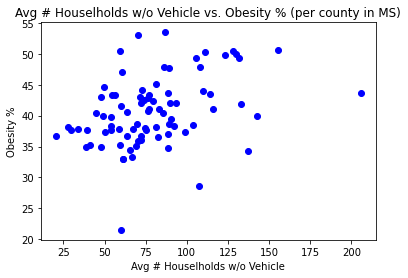

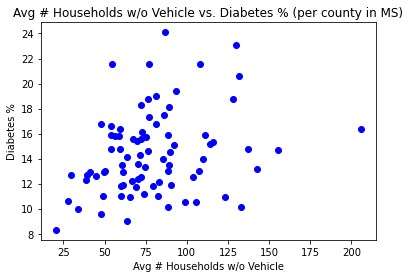

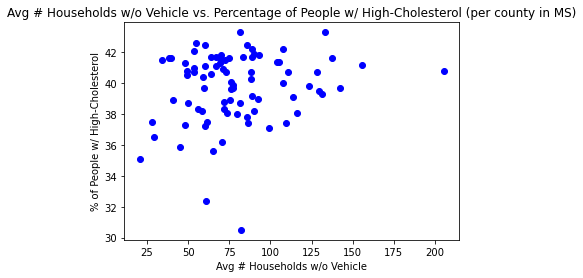

In [86]:
plot1 = plt.figure(1)
plt.plot(MS_df['Lahunv1'], MS_df['Obesity_perc'],'bo')
plt.title("Avg # Houselholds w/o Vehicle vs. Obesity % (per county in MS)")
plt.xlabel('Avg # Houselholds w/o Vehicle')
plt.ylabel('Obesity %')
plt.savefig('MSQ3Plot1.png',bbox_inches="tight")
plt.show()

plot2 = plt.figure(2)
plt.plot(MS_df['Lahunv1'], MS_df['Diabetes_perc'],'bo')
plt.title("Avg # Households w/o Vehicle vs. Diabetes % (per county in MS)")
plt.xlabel('Avg # Households w/o Vehicle')
plt.ylabel('Diabetes %')
plt.savefig('MSQ3Plot2.png',bbox_inches="tight")
plt.show()

plot3 = plt.figure(3)
plt.plot(MS_df['Lahunv1'], MS_df['HighCol'],'bo')
plt.title("Avg # Households w/o Vehicle vs. Percentage of People w/ High-Cholesterol (per county in MS)")
plt.xlabel('Avg # Households w/o Vehicle')
plt.ylabel('% of People w/ High-Cholesterol')
plt.savefig('MSQ3Plot3.png',bbox_inches="tight")
plt.show()

# Statistical Test for Research Q4

Mann Whitney U-Test will be used since LA1and10 is non-Guassian

In [87]:
# get food desert data from counties w/ higher poverty rate
MS_poverty_top_df = MS_df.nlargest(sample_size, 'PovertyRate')
# get food desert data from counties w/ lower Lahunv1
MS_poverty_low_df = MS_df.nsmallest(sample_size, 'PovertyRate')
# mannwhitneyu
stat, p = stats.mannwhitneyu(x=MS_poverty_top_df['LA1and10'], y=MS_poverty_low_df['LA1and10'], alternative = 'two-sided')
print('Unpaired T-test result for food deserts in counties with high poverty rates and food deserts data in counties with low poverty rates: %.3f' % p)
if p < cutoff:
    print('food deserts in counties with high poverty rates and food deserts in counties with low poverty rates are significantly different from each other')
else:
    print('food deserts in counties with high poverty rates and food deserts in counties with low poverty rates are similar')

Unpaired T-test result for food deserts in counties with high poverty rates and food deserts data in counties with low poverty rates: 0.935
food deserts in counties with high poverty rates and food deserts in counties with low poverty rates are similar


Scatterplots

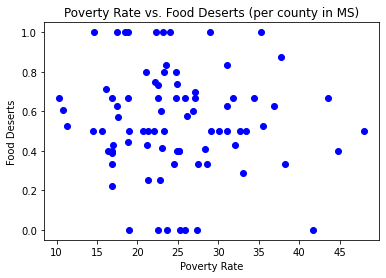

In [88]:
plot1 = plt.figure(1)
plt.plot(MS_df['PovertyRate'], MS_df['LA1and10'],'bo')
plt.title("Poverty Rate vs. Food Deserts (per county in MS)")
plt.xlabel('Poverty Rate')
plt.ylabel('Food Deserts')
plt.savefig('MSQ4Plot1.png',bbox_inches="tight")
plt.show()

# ---------------------------------------------------------------------------------------------------------------

# Machine Learning Models for Predicting LA1and10 column

In [89]:
def model_and_eval(x_train, x_test, y_train, y_test):
    
#Linear Model
    linear_model = LinearRegression()
    linear_model.fit(x_train, y_train)
    prediction_lm = linear_model.predict(x_test)

   
    mae_lm = metrics.mean_absolute_error(y_test, prediction_lm)
    mse_lm = metrics.mean_squared_error(y_test, prediction_lm)
    rmse_lm = np.sqrt(metrics.mean_squared_error(y_test, prediction_lm))
    r2_lm = metrics.r2_score(y_test, prediction_lm)
    
# KNN
    k_dict = {}
    for k in range(1,50):
        knn_model = KNeighborsRegressor(n_neighbors = k)
        knn_model.fit(x_train, y_train)
        prediction_knn = knn_model.predict(x_test)
        r2_knn = metrics.r2_score(y_test, prediction_knn)
        k_dict[k] =  r2_knn
    k = max(k_dict, key = k_dict.get) 

    knn_model = KNeighborsRegressor(n_neighbors = k)
    knn_model.fit(x_train, y_train)
    prediction_knn = knn_model.predict(x_test)

    mae_knn = metrics.mean_absolute_error(y_test, prediction_knn)
    mse_knn = metrics.mean_squared_error(y_test, prediction_knn)
    rmse_knn = np.sqrt(metrics.mean_squared_error(y_test, prediction_knn))
    r2_knn = metrics.r2_score(y_test, prediction_knn)

#DT
    dt_model = DecisionTreeRegressor()
    dt_model.fit(x_train, y_train)
    prediction_dt = dt_model.predict(x_test)

    mae_dt = metrics.mean_absolute_error(y_test, prediction_dt)
    mse_dt  = metrics.mean_squared_error(y_test, prediction_dt)
    rmse_dt  = np.sqrt(metrics.mean_squared_error(y_test, prediction_dt))
    r2_dt  = metrics.r2_score(y_test, prediction_dt)

# RF
    rf_model = RandomForestRegressor()
    rf_model.fit(x_train, y_train)
    prediction_rf = rf_model.predict(x_test)

    mae_rf = metrics.mean_absolute_error(y_test, prediction_rf)
    mse_rf  = metrics.mean_squared_error(y_test, prediction_rf)
    rmse_rf  = np.sqrt(metrics.mean_squared_error(y_test, prediction_rf))
    r2_rf  = metrics.r2_score(y_test, prediction_rf)


# SGD
    sgd_model = SGDRegressor()
    sgd_model.fit(x_train, y_train)
    prediction_sgd = sgd_model.predict(x_test)

    mae_sgd = metrics.mean_absolute_error(y_test, prediction_sgd)
    mse_sgd = metrics.mean_squared_error(y_test, prediction_sgd)
    rmse_sgd = np.sqrt(metrics.mean_squared_error(y_test, prediction_sgd))
    r2_sgd = metrics.r2_score(y_test, prediction_sgd)

# GB
    gb_model = GradientBoostingRegressor()
    gb_model.fit(x_train, y_train)
    prediction_gb = gb_model.predict(x_test)

    mae_gb = metrics.mean_absolute_error(y_test, prediction_gb)
    mse_gb = metrics.mean_squared_error(y_test, prediction_gb)
    rmse_gb = np.sqrt(metrics.mean_squared_error(y_test, prediction_gb))
    r2_gb = metrics.r2_score(y_test, prediction_gb)

    lm = [mse_lm ,mae_lm, rmse_lm, r2_lm]
    knn = [mse_knn ,mae_knn, rmse_knn, r2_knn]
    dt = [mse_dt ,mae_dt, rmse_dt, r2_dt]
    rf = [mse_rf ,mae_rf, rmse_rf, r2_rf]
    sgd = [mse_sgd ,mae_sgd, rmse_sgd, r2_sgd]
    gb = [mse_gb ,mae_gb, rmse_gb, r2_gb]
    mod = (linear_model, knn_model, dt_model, rf_model, sgd_model, gb_model)
    eval_metric = {'Metrics':['MAE','MSE','RMSE','R2 Score'],
             "Linear ": [ mae_lm,  mse_lm,  rmse_lm, r2_lm],
             "KNN ":[ mae_knn, mse_knn,  rmse_knn, r2_knn],
             "Decision Tree ":[ mae_dt,  mse_dt,  rmse_dt, r2_dt],
             "Random Forest ":[ mae_rf,  mse_rf,  rmse_rf, r2_rf],
             "SGD":[ mae_sgd,  mse_sgd,  rmse_sgd, r2_sgd],
             "GB Regressor":[ mae_gb,  mse_gb,  rmse_gb, r2_gb]    
    }
    
    return mod,  eval_metric

Get dataframe for predictive modeling

In [90]:
food_df['PopB_perc'] = food_df['TotalPopB']/food_df['TotalPop']
food_df['PopW_perc'] = food_df['TotalPopW']/food_df['TotalPop']
df = food_df[['StateID','LA1and10','Lahunv1','Obesity_perc','Diabetes_perc','HighCol','LowIncomeTracts','PovertyRate','MedianFamilyIncome','S1501_C01_009E','S1501_C01_010E','PopB_perc','PopW_perc','CarDisDeathRateB','CarDisDeathRateW']]
df.dropna(axis=0,inplace=True)

# General Model for Counties in all States and its evaluation metrics

In [91]:
X = df.drop(['StateID','LA1and10'], axis = 1)
Y = df['LA1and10']
display(list(X.columns.values))

ss1 = StandardScaler()
X = pd.DataFrame(ss1.fit_transform(X),columns = X.columns)

x_train, x_test, y_train, y_test = train_test_split(X, Y, random_state = 1, test_size = 0.2)
gen_mod, gen_eval_metric = model_and_eval(x_train, x_test, y_train, y_test)

print(tabulate(gen_eval_metric, headers="keys")) 

['Lahunv1',
 'Obesity_perc',
 'Diabetes_perc',
 'HighCol',
 'LowIncomeTracts',
 'PovertyRate',
 'MedianFamilyIncome',
 'S1501_C01_009E',
 'S1501_C01_010E',
 'PopB_perc',
 'PopW_perc',
 'CarDisDeathRateB',
 'CarDisDeathRateW']

Metrics      Linear        KNN     Decision Tree     Random Forest         SGD    GB Regressor
---------  ---------  ---------  ----------------  ----------------  ---------  --------------
MAE        0.224692   0.213349           0.268799         0.209336   0.224653        0.210992
MSE        0.0800726  0.0752649          0.129605         0.0751395  0.0806458       0.0750915
RMSE       0.282971   0.274345           0.360007         0.274116   0.283982        0.274028
R2 Score   0.0385331  0.0962614         -0.556224         0.0977668  0.0316504       0.0983438


# Model for Low Performing States and its evaluation metrics

In [92]:
def stateData(stateId):
    return df.groupby('StateID').get_group(stateId)

AL = stateData('AL')
MS = stateData('MS')
WV = stateData('WV')

low_df = pd.concat([AL,MS, WV])
low_df=low_df.sample(frac=1)

X = low_df.drop(['StateID','LA1and10'], axis = 1)
Y = low_df['LA1and10']

ss1 = StandardScaler()
X = pd.DataFrame(ss1.fit_transform(X),columns = X.columns)

x_train, x_test, y_train, y_test = train_test_split(X, Y, random_state = 1, test_size = 0.2)
low_mod, low_eval_metric = model_and_eval(x_train, x_test, y_train, y_test)

print(tabulate(low_eval_metric, headers="keys")) 

Metrics      Linear        KNN     Decision Tree     Random Forest         SGD    GB Regressor
---------  ---------  ---------  ----------------  ----------------  ---------  --------------
MAE        0.211387   0.189788          0.200602          0.196473   0.200874        0.215301
MSE        0.074194   0.0532076         0.0701069         0.0627691  0.0655494       0.07392
RMSE       0.272386   0.230668          0.264777          0.250538   0.256026        0.271882
R2 Score   0.0742283  0.336091          0.125227          0.216785   0.182094        0.0776482


#  Model for High Performing States and its evaluation metrics

In [93]:
def stateData(stateId):
    return df.groupby('StateID').get_group(stateId)

GA = stateData('GA')
IN = stateData('IN')
CA = stateData('CA')
high_df = pd.concat([GA,IN, CA])
high_df= high_df.sample(frac=1)

X = high_df.drop(['StateID','LA1and10'], axis = 1)
Y = high_df['LA1and10']

ss1 = StandardScaler()
X = pd.DataFrame(ss1.fit_transform(X),columns = X.columns)

x_train, x_test, y_train, y_test = train_test_split(X, Y, random_state = 1, test_size = 0.2)
high_mod, high_eval_metric = model_and_eval(x_train, x_test, y_train, y_test)

print(tabulate(high_eval_metric, headers="keys"))  

Metrics      Linear        KNN     Decision Tree     Random Forest         SGD    GB Regressor
---------  ---------  ---------  ----------------  ----------------  ---------  --------------
MAE        0.169102   0.162985          0.213077          0.167071   0.16319         0.17478
MSE        0.0444155  0.0436815         0.0895244         0.0459422  0.0423505       0.0539223
RMSE       0.21075    0.209001          0.299206          0.214341   0.205792        0.232212
R2 Score   0.163152   0.17698          -0.686763          0.134386   0.202059       -0.0159696


## Creating Models for High Performing States and testing them on Low Performing States

In [94]:
def stateData(stateId):
    return df.groupby('StateID').get_group(stateId)

GA = stateData('GA')
IN = stateData('IN')
CA = stateData('CA')
high_df = pd.concat([GA,IN, CA])
high_df= high_df.sample(frac=1)

X = high_df.drop(['StateID','LA1and10'], axis = 1)
Y = high_df['LA1and10']

ss1 = StandardScaler()
X = pd.DataFrame(ss1.fit_transform(X),columns = X.columns)

AL = stateData('AL')
MS = stateData('MS')
WV = stateData('WV')
low_df = pd.concat([AL,MS, WV])
low_df=low_df.sample(frac=1)

x= low_df.drop(['StateID','LA1and10'], axis = 1)
y = low_df['LA1and10']

ss1 = StandardScaler()
x = pd.DataFrame(ss1.fit_transform(x),columns = x.columns)

x_train, x_test, y_train, y_test = train_test_split(X, Y, random_state = 1, test_size = 0.2)
high_low_mod, high_low_eval_metric = model_and_eval(X, x, Y, y)

print(tabulate(high_low_eval_metric, headers="keys")) 

Metrics       Linear         KNN     Decision Tree     Random Forest          SGD    GB Regressor
---------  ----------  ----------  ----------------  ----------------  ----------  --------------
MAE         0.231809    0.223409           0.324608         0.23971     0.217031        0.246771
MSE         0.0838299   0.0803572          0.165372         0.0915951   0.0772469       0.0932687
RMSE        0.289534    0.283473           0.406659         0.302647    0.277933        0.305399
R2 Score   -0.156598   -0.108686          -1.28163         -0.263735   -0.0657734      -0.286825


## Creating Models for Low Performing States and testing them on High Performing States

In [95]:
def stateData(stateId):
    return df.groupby('StateID').get_group(stateId)

AL = stateData('AL')
MS = stateData('MS')
WV = stateData('WV')
low_df = pd.concat([AL,MS, WV])
low_df=low_df.sample(frac=1)

X= low_df.drop(['StateID','LA1and10'], axis = 1)
Y = low_df['LA1and10']

ss1 = StandardScaler()
X = pd.DataFrame(ss1.fit_transform(X),columns = X.columns)

GA = stateData('GA')
IN = stateData('IN')
CA = stateData('CA')
high_df = pd.concat([GA,IN, CA])
high_df= high_df.sample(frac=1)

x = high_df.drop(['StateID','LA1and10'], axis = 1)
y = high_df['LA1and10']

ss1 = StandardScaler()
x = pd.DataFrame(ss1.fit_transform(x),columns = x.columns)

x_train, x_test, y_train, y_test = train_test_split(X, Y, random_state = 1, test_size = 0.2)
low_high_mod, low_high_eval_metric = model_and_eval(X, x, Y, y)

print(tabulate(low_high_eval_metric, headers="keys"))  

Metrics       Linear         KNN     Decision Tree     Random Forest          SGD    GB Regressor
---------  ----------  ----------  ----------------  ----------------  ----------  --------------
MAE         0.221203    0.213849           0.293916         0.219769    0.208639        0.221901
MSE         0.0785656   0.0712706          0.135151         0.0770669   0.0685441       0.0782669
RMSE        0.280296    0.266966           0.367628         0.277609    0.261809        0.279762
R2 Score   -0.314232   -0.192203          -1.26078         -0.289163   -0.146594       -0.309236
